In [361]:
import tensorflow as tf
import keras
import numpy as np
import os
# to make this notebook's output stable across runs
def reset_graph(seed=42):
    tf.reset_default_graph()
    tf.set_random_seed(seed)
    np.random.seed(seed)

# To plot pretty figures
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

import pandas as pd
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, LabelEncoder
import seaborn as sns

import scipy.stats as sc_stats

import random

from sklearn.model_selection import train_test_split


from mpl_toolkits.mplot3d import Axes3D


In [362]:
def add_releveant_features(task_df):


    task_df['PrevOutcome']=task_df['Outcome'].shift(1)
    task_df.loc[1,'PrevOutcome']= 0

    task_df['PrevChoice']=task_df['Choice'].shift(1)
    task_df.loc[1,'PrevChoice']= 0

    task_df['PrevSafe']=task_df['Safe'].shift(1)
    task_df.loc[1,'PrevSafe']= 0

    task_df['PrevBigRisky']=task_df['BigRisky'].shift(1)
    task_df.loc[1,'PrevBigRisky']= 0

    task_df['PrevSmallRisky']=task_df['SmallRisky'].shift(1)
    task_df.loc[1,'PrevSmallRisky']= 0
    
#     task_df['PrevRT']=task_df['RT'].shift(1)
#     task_df.loc[1,'PrevRT']= 0
    
    
    
    return task_df

In [363]:
def add_kback_features(task_df):

    for k in range(1,11):
        task_df[str(k)+'backOutcome']=task_df['Outcome'].shift(k)
        task_df[str(k)+'backChoice']=task_df['Choice'].shift(k)
        task_df[str(k)+'backSafe']=task_df['Safe'].shift(k)
        task_df[str(k)+'backBigRisky']=task_df['BigRisky'].shift(k)
        task_df[str(k)+'backSmallRisky']=task_df['SmallRisky'].shift(k)

    return task_df

In [364]:
dir_list = os.listdir("/Users/ritwik7/Dropbox (Personal)/Postdoc_UCL/DATA/rlab_incomplete_rewardSWB_code/by_RN/appdata/")
dir_path ="/Users/ritwik7/Dropbox (Personal)/Postdoc_UCL/DATA/rlab_incomplete_rewardSWB_code/by_RN/appdata/"

subj_files_list =[]; ## list of subject_files fullfilling a criteria

dir_files = [i for i in os.listdir(dir_path) if i.startswith('sub')]

for subj_file_path in dir_files:

    file_path  ="/Users/ritwik7/Dropbox (Personal)/Postdoc_UCL/DATA/rlab_incomplete_rewardSWB_code/by_RN/appdata/"+ subj_file_path
    mypath =file_path
    
    play_names = [i for i in os.listdir(mypath) if os.path.isfile(os.path.join(mypath,i)) and i.startswith('app')]   
    
    if len(play_names) >= 50: ## criteria
        subj_files_list.append(subj_file_path)
        


### GET TRAIN AND TEST DATA SETS

In [317]:
# for num, subj_file_path in enumerate(subj_files_list):
    
#     file_path  ="/Users/ritwik7/Dropbox (Personal)/Postdoc_UCL/DATA/rlab_incomplete_rewardSWB_code/by_RN/appdata/"+ subj_file_path
#     Keras_file_path = file_path
                
#     file_path = file_path + "/OddEvenPlays/RandomizedPlays1"

#     train_data_df= pd.read_csv(file_path+"/train_data.csv")
#     test_data_df = pd.read_csv(file_path+"/val_test_data.csv")
    
#     Keras_file_path = Keras_file_path + "/Play_by_play"
    
#     ## REMOVE USELESS COLUMNS 
#     train_data_df = train_data_df.drop(columns=['Unnamed: 0'])
#     test_data_df = test_data_df.drop(columns=['Unnamed: 0', 'Unnamed: 0.1'])
    
#     if (test_data_df.shape[0]/2).is_integer():

#         train_data_df = pd.concat((add_kback_features(train_data_df), test_data_df.iloc[0:int(test_data_df.shape[0]/(2))]  ), axis=0)
#         test_data_df = test_data_df.iloc[int(test_data_df.shape[0]/(2)):test_data_df.shape[0]]
    
#     else:
#         train_data_df = pd.concat((add_kback_features(train_data_df), test_data_df.iloc[0:29*int(test_data_df.shape[0]/(2*29))]  ), axis=0)
#         test_data_df = test_data_df.iloc[29*int(test_data_df.shape[0]/(2*29)):test_data_df.shape[0]]
    
    
#     print(train_data_df.shape[0]/29)
#     print(test_data_df.shape[0]/29)
#     print(Keras_file_path)
#     train_data_df.to_csv(Keras_file_path + "/train_data.csv")
#     test_data_df.to_csv(Keras_file_path + "/test_data.csv")
    

In [365]:
randomize_trials_flag=False
hist_flag=4

In [366]:
all_subj_metrics_df = pd.DataFrame(); all_subj_metrics_manual_df = pd.DataFrame()
neurons=8
dir_list = os.listdir("/Users/ritwik7/Dropbox (Personal)/Postdoc_UCL/DATA/rlab_incomplete_rewardSWB_code/by_RN/appdata/")
dir_path ="/Users/ritwik7/Dropbox (Personal)/Postdoc_UCL/DATA/rlab_incomplete_rewardSWB_code/by_RN/appdata/"

dir_files = [i for i in os.listdir(dir_path) if i.startswith('sub')]


# for num, subj_file_path in enumerate(dir_files):
for num, subj_file_path in enumerate(subj_files_list):
    
    
    file_path  ="/Users/ritwik7/Dropbox (Personal)/Postdoc_UCL/DATA/rlab_incomplete_rewardSWB_code/by_RN/appdata/"+ subj_file_path
    Keras_file_path = file_path
    Keras_file_path = Keras_file_path + "/Play_by_play"
  
    
    
    subj_num = subj_file_path
    
#     all_subj_metrics_df["Subject_number"]=subj_num

    if hist_flag==0:
        
        file_name = Keras_file_path+"/LSTM_updated_Crossval_currO_metricsneurons="+str(neurons)+".csv"
        
    elif hist_flag==1:
         file_name = Keras_file_path+"/LSTM_updated_Crossval_currOprevC_metricsneurons="+str(neurons)+".csv"
            
    elif hist_flag==2:
         file_name = Keras_file_path+"/LSTM_updated_Crossval_currOprevR_metricsneurons="+str(neurons)+".csv"
            
            
    elif hist_flag==3:
         file_name = Keras_file_path+"/LSTM_updated_Crossval_currOprevRC_metricsneurons="+str(neurons)+".csv"


    
    elif hist_flag==4:
        file_name = Keras_file_path + "/LSTM_updated_Crossval_currprev_opts_metricsneurons="+str(neurons)+".csv"
    
    
    
    
    
#     all_subj_metrics_manual_df = all_subj_metrics_manual_df.append(pd.read_csv(file_path+"/metric_manual.csv"))
    
    
    
    
    
    
#     metric_out_df.to_csv(file_path+"LSTM_updated_CrossvalTESTinsess2ndhalf_currprev_opts_metrics_neurons="+str(neurons)+".csv")

    all_subj_metrics_df = all_subj_metrics_df.append(pd.read_csv(file_name))
    

In [367]:
all_subj_metrics_df.drop(columns = ["Unnamed: 0"])

,accuracy_train,loss_train,pseudoR2_train,accuracy_test,loss_test,pseudoR2_test,neurons,epochs
0,0.877332,0.290225,0.581293,0.858621,0.340968,0.508088,8.0,5000.0
0,0.867085,0.294871,0.574590,0.844362,0.337215,0.513502,8.0,5000.0
0,0.745358,0.530147,0.235159,0.694960,0.612993,0.115638,8.0,5000.0
0,0.739655,0.545141,0.213528,0.732095,0.582450,0.159703,8.0,5000.0
0,0.796831,0.476274,0.312882,0.740053,0.533466,0.230371,8.0,5000.0
0,0.659182,0.614823,0.112998,0.698851,0.592783,0.144794,8.0,5000.0
0,0.886445,0.315205,0.545255,0.824138,0.409679,0.408959,8.0,5000.0
0,0.639621,0.622624,0.101744,0.671400,0.609551,0.120604,8.0,5000.0
0,0.878311,0.295447,0.573761,0.859070,0.331685,0.521479,8.0,5000.0
0,0.784029,0.557873,0.195159,0.631300,0.683511,0.013902,8.0,5000.0


In [368]:
all_subj_metrics_df8=all_subj_metrics_df
# all_subj_metrics_manual_df8 = all_subj_metrics_manual_df

In [369]:
# all_subj_metrics_df8.to_csv(dir_path+"Summaries/curr_prev_opts_all_subj_metrics_df8_testsess.csv") ## current options, prev actions, prev outcome, prev opts
# all_subj_metrics_manual_df8.to_csv(dir_path+"Summaries/curr_prev_opts_all_subj_metrics_manual_df8_testsess.csv") ## current options, prev actions, prev outcome, prev opts

if hist_flag ==0 :
    all_subj_metrics_df8.to_csv(dir_path+"Summaries/Play_by_play/currO_all_subj_metrics_df8_testsess.csv") ## current options
#     all_subj_metrics_manual_df8.to_csv(dir_path+"Summaries/OddEvenPlays/RandomizedPlays1/currO_all_subj_metrics_manual_df8_testsess.csv") ## current options

    
#     if randomize_trials_flag==True:
#         all_subj_metrics_df8.to_csv(dir_path+"Summaries/OddEvenPlays/RandomizedPlays1/RandomizedTrials/currO_all_subj_metrics_df8_testsess.csv") ## current options
#         all_subj_metrics_manual_df8.to_csv(dir_path+"Summaries/OddEvenPlays/RandomizedPlays1/RandomizedTrials/currO_all_subj_metrics_manual_df8_testsess.csv") ## current options

    
elif hist_flag ==1 :
    all_subj_metrics_df8.to_csv(dir_path+"Summaries/Play_by_play/currOprevC_all_subj_metrics_df8_testsess.csv") ## current options, prev actions
#     all_subj_metrics_manual_df8.to_csv(dir_path+"Summaries/OddEvenPlays/RandomizedPlays1/currOprevC_all_subj_metrics_manual_df8_testsess.csv") ## current options, prev actions,

elif hist_flag ==2:
    all_subj_metrics_df8.to_csv(dir_path+"Summaries/Play_by_play/currOprevR_all_subj_metrics_df8_testsess.csv") ## current options, prev reward
#     all_subj_metrics_manual_df8.to_csv(dir_path+"Summaries/OddEvenPlays/RandomizedPlays1/currOprevR_all_subj_metrics_manual_df8_testsess.csv") ## current options, prev reward
    
    
    
elif hist_flag ==3 :
    all_subj_metrics_df8.to_csv(dir_path+"Summaries/Play_by_play/currOprevRC_all_subj_metrics_df8_testsess.csv") ## current options, prev actions, prev outcomes
#     all_subj_metrics_manual_df8.to_csv(dir_path+"Summaries/OddEvenPlays/RandomizedPlays1/currOprevRC_all_subj_metrics_manual_df8_testsess.csv") ## current options, prev outcomes


elif hist_flag==4 :
    all_subj_metrics_df8.to_csv(dir_path+"Summaries/Play_by_play/curr_prev_opts_all_subj_metrics_df8_testsess.csv") ## current options, prev actions, prev outcome, prev opts
#     all_subj_metrics_manual_df8.to_csv(dir_path+"Summaries/OddEvenPlays/RandomizedPlays1/curr_prev_opts_all_subj_metrics_manual_df8_testsess.csv") ## current options, prev actions, prev outcome, prev opts



In [370]:
Keras_file_path

'/Users/ritwik7/Dropbox (Personal)/Postdoc_UCL/DATA/rlab_incomplete_rewardSWB_code/by_RN/appdata/subject_num_108107/Play_by_play'

In [371]:
hist_flag

4

In [324]:
PT_file_path ="/Users/ritwik7/Dropbox (Personal)/Postdoc_UCL/DATA/rlab_incomplete_rewardSWB_code/by_RN/appdata/"
PT_file_name = PT_file_path + "/Summaries/Play_by_play/PT_loss_updated_50_split_combined_1sthalf.csv"


PT_metrics = pd.read_csv(PT_file_name)
PT_metrics = PT_metrics[PT_metrics.PT_loss !=0]
PT_metrics

,Subject_number,PT_loss,PT_pseudoR2,PT_accuracy,PT_loss_test,PT_pseudoR2_test,PT_accuracy_test
1,2,567.365232,0.294366,0.679303,227.529278,0.191489,0.653583
37,38,749.700999,0.282765,0.668177,253.586744,0.299141,0.662793
64,65,2038.057545,0.512550,0.791298,792.580183,0.436723,0.776178
80,81,486.984270,0.378807,0.710877,152.149790,0.417757,0.714872
89,90,636.797837,0.311316,0.688079,234.748513,0.221447,0.665120
118,119,641.121418,0.160669,0.602749,231.515115,0.114043,0.591037
131,132,808.523027,0.064593,0.543084,268.052235,0.110994,0.555557
133,134,800.669783,0.094732,0.560968,283.186921,0.060799,0.553099
157,158,582.357962,0.356195,0.703467,201.292635,0.332405,0.688506
171,172,624.287954,0.391036,0.727257,213.987819,0.373795,0.724487


## MODEL COMPARISON

In [372]:
all_subj_metrics_manual_currO=pd.read_csv(dir_path+"Summaries/Play_by_play/currO_all_subj_metrics_df8_testsess.csv") ## current options
all_subj_metrics_manual_currOprevC=pd.read_csv(dir_path+"Summaries/Play_by_play/currOprevC_all_subj_metrics_df8_testsess.csv") ## current options + prev actionn

all_subj_metrics_manual_currOprevR=pd.read_csv(dir_path+"Summaries/Play_by_play/currOprevR_all_subj_metrics_df8_testsess.csv") ## current options + prev rewards

all_subj_metrics_manual_currOprevRC=pd.read_csv(dir_path+"Summaries/Play_by_play/currOprevRC_all_subj_metrics_df8_testsess.csv") ## current options + prev action+ prev outcomes

all_subj_metrics_manual_currprevopts=pd.read_csv(dir_path+"Summaries/Play_by_play/curr_prev_opts_all_subj_metrics_df8_testsess.csv") ## current options, prev actions, prev outcome, prev opts



# ######## RANDOMIZED TRIALS
# all_subj_metrics_manual_currO_randdomtrials  = pd.read_csv(dir_path+"Summaries/OddEvenPlays/RandomizedPlays1/RandomizedTrials/currO_all_subj_metrics_manual_df8_testsess.csv") ## current options



## PROSPECT THEORY VS RNN

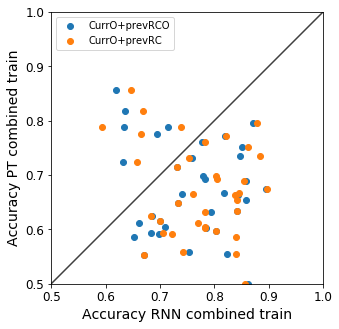

In [304]:
fig,ax= plt.subplots(figsize=(5,5))
lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]
ax.plot(lims,lims,color='black',alpha=0.75, zorder=0)
ax.set_aspect('equal')
ax.set_xlabel('Accuracy RNN combined train',Fontsize=14);
ax.set_ylabel('Accuracy PT combined train'  ,Fontsize=14);

ax.set_xlim([0.5,1])
ax.set_ylim([0.5,1]);


plt.scatter(all_subj_metrics_manual_currprevopts.accuracy_test,PT_metrics.PT_accuracy_test,label = "CurrO+prevRCO")
plt.scatter(all_subj_metrics_manual_currOprevRC.accuracy_test, PT_metrics.PT_accuracy_test, label="CurrO+prevRC")

# plt.scatter(all_subj_metrics_manual_currO.accuracy_test, PT_metrics.PT_accuracy_test, label="CurrO")




plt.legend(loc=0);
# plt.savefig(dir_path+"Summaries/OddEvenPlays/RandomizedPlays1" +"/Accuracy_train_RNN_PT.pdf")

In [329]:
sc_stats.wilcoxon(all_subj_metrics_manual_currO.accuracy_test, PT_metrics.PT_accuracy_test)

WilcoxonResult(statistic=166.0, pvalue=0.005133961518895217)

## RNN vs RNN

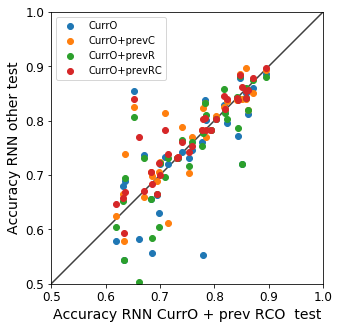

In [352]:
fig,ax= plt.subplots(figsize=(5,5))
lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]
ax.plot(lims,lims,color='black',alpha=0.75, zorder=0)
ax.set_aspect('equal')
ax.set_xlabel('Accuracy RNN CurrO + prev RCO  test',Fontsize=14);
ax.set_ylabel('Accuracy RNN other test'  ,Fontsize=14);

ax.set_xlim([0.5,1])
ax.set_ylim([0.5,1]);



plt.scatter(all_subj_metrics_manual_currprevopts.accuracy_test, all_subj_metrics_manual_currO.accuracy_test,label="CurrO")

plt.scatter(all_subj_metrics_manual_currprevopts.accuracy_test, all_subj_metrics_manual_currOprevC.accuracy_test,label="CurrO+prevC")
plt.scatter(all_subj_metrics_manual_currprevopts.accuracy_test, all_subj_metrics_manual_currOprevR.accuracy_test,label="CurrO+prevR")

plt.scatter(all_subj_metrics_manual_currprevopts.accuracy_test, all_subj_metrics_manual_currOprevRC.accuracy_test,label="CurrO+prevRC")




plt.legend(loc=0);
# plt.savefig(dir_path+"Summaries/OddEvenPlays/RandomizedPlays1" +"/Accuracy_train_RNN_PT.pdf")

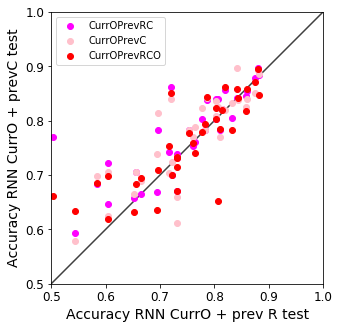

In [373]:
### RNN prevChoice vs RNN prevR

fig,ax= plt.subplots(figsize=(5,5))
lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]
ax.plot(lims,lims,color='black',alpha=0.75, zorder=0)
ax.set_aspect('equal')
ax.set_xlabel('Accuracy RNN CurrO + prev R test',Fontsize=14);
ax.set_ylabel('Accuracy RNN CurrO + prevC test'  ,Fontsize=14);

ax.set_xlim([0.5,1])
ax.set_ylim([0.5,1]);


plt.scatter(all_subj_metrics_manual_currOprevR.accuracy_test, all_subj_metrics_manual_currOprevRC.accuracy_test,label="CurrOPrevRC",color="magenta")

plt.scatter(all_subj_metrics_manual_currOprevR.accuracy_test, all_subj_metrics_manual_currOprevC.accuracy_test,label="CurrOPrevC",color="pink")
plt.scatter(all_subj_metrics_manual_currOprevR.accuracy_test, all_subj_metrics_manual_currprevopts.accuracy_test,label="CurrOPrevRCO",color="red")




plt.legend(loc=0);
# plt.savefig(dir_path+"Summaries/OddEvenPlays/RandomizedPlays1" +"/Accuracy_train_RNN_PT.pdf")

In [355]:
sc_stats.wilcoxon(all_subj_metrics_manual_currOprevR.accuracy_test, all_subj_metrics_manual_currOprevC.accuracy_test)

WilcoxonResult(statistic=160.5, pvalue=0.03201485728313478)

## Model Comparison

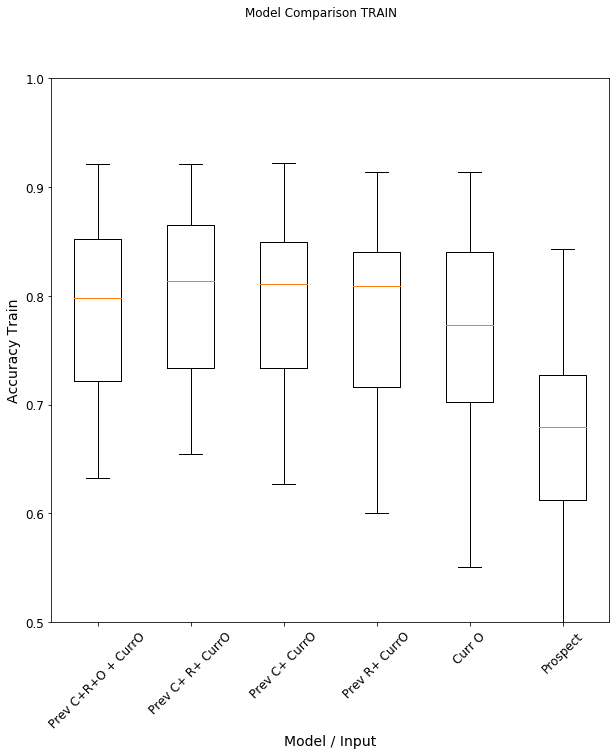

In [388]:
train_Acc_all_models_df = {'currprevopts':all_subj_metrics_manual_currprevopts.accuracy_train,  'currOprevRC':all_subj_metrics_manual_currOprevRC.accuracy_train,'currOprevC':all_subj_metrics_manual_currOprevC.accuracy_train, 'currOprevR':all_subj_metrics_manual_currOprevR.accuracy_train,'currO':all_subj_metrics_manual_currO.accuracy_train, 'PT':PT_metrics.PT_accuracy.to_list()}
train_Acc_all_models_df = pd.DataFrame(train_Acc_all_models_df)
plt.figure(figsize=(10,10))
# plt.boxplot(np.array([train_R2_all_models_df.PrevCRORT,train_R2_all_models_df.PrevCRO,train_R2_all_models_df.PrevCR,train_R2_all_models_df.Curr,train_R2_all_models_df.PT]).T,labels=["PrevC+R+O+RT+ CurrO","PrevC+R+O+ CurrO","PrevC+R +CurrO","CurrO","Prospect"]);
plt.boxplot(np.array([train_Acc_all_models_df.currprevopts,train_Acc_all_models_df.currOprevRC,train_Acc_all_models_df.currOprevC,train_Acc_all_models_df.currOprevR, train_Acc_all_models_df.currO,train_Acc_all_models_df.PT]).T, labels=["Prev C+R+O + CurrO","Prev C+ R+ CurrO","Prev C+ CurrO","Prev R+ CurrO","Curr O","Prospect"] );

plt.xlabel("Model / Input");
plt.ylabel('Accuracy Train');
plt.suptitle("Model Comparison TRAIN");
plt.xticks(rotation=45)
plt.ylim([0.5,1]);



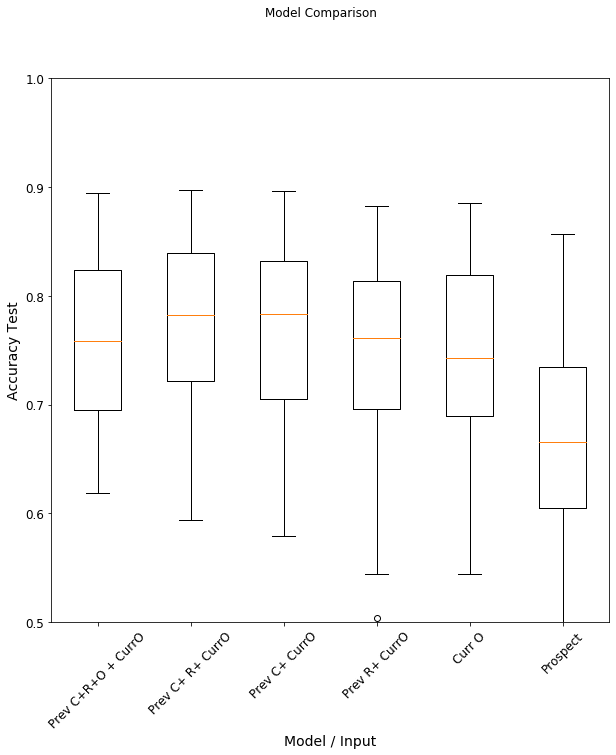

In [384]:
test_Acc_all_models_df = {'currprevopts':all_subj_metrics_manual_currprevopts.accuracy_test,  'currOprevRC':all_subj_metrics_manual_currOprevRC.accuracy_test,'currOprevC':all_subj_metrics_manual_currOprevC.accuracy_test, 'currOprevR':all_subj_metrics_manual_currOprevR.accuracy_test,'currO':all_subj_metrics_manual_currO.accuracy_test, 'PT':PT_metrics.PT_accuracy_test.to_list()}
test_Acc_all_models_df = pd.DataFrame(test_Acc_all_models_df)
plt.figure(figsize=(10,10))
# plt.boxplot(np.array([train_R2_all_models_df.PrevCRORT,train_R2_all_models_df.PrevCRO,train_R2_all_models_df.PrevCR,train_R2_all_models_df.Curr,train_R2_all_models_df.PT]).T,labels=["PrevC+R+O+RT+ CurrO","PrevC+R+O+ CurrO","PrevC+R +CurrO","CurrO","Prospect"]);
plt.boxplot(np.array([test_Acc_all_models_df.currprevopts,test_Acc_all_models_df.currOprevRC,test_Acc_all_models_df.currOprevC,test_Acc_all_models_df.currOprevR, test_Acc_all_models_df.currO,test_Acc_all_models_df.PT]).T, labels=["Prev C+R+O + CurrO","Prev C+ R+ CurrO","Prev C+ CurrO","Prev R+ CurrO","Curr O","Prospect"] );

plt.xlabel("Model / Input");
plt.ylabel('Accuracy Test');
plt.suptitle("Model Comparison");
plt.xticks(rotation=45)
plt.ylim([0.5,1]);

# # plt.savefig(LSTM_file_path+"/ModelComparison_train.pdf")
# plt.savefig(dir_path+"Summaries/OddEvenPlays/RandomizedPlays1" +"/ModelComparison.pdf")

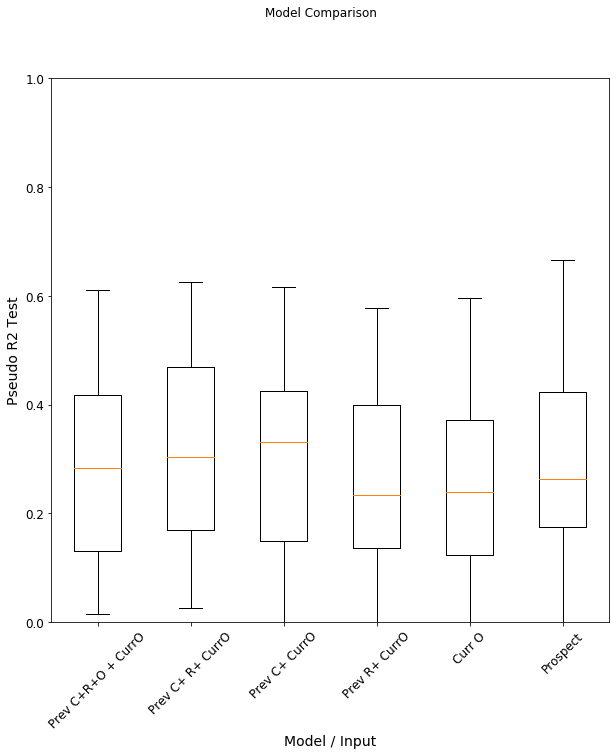

In [381]:
train_R2_all_models_df = {'currprevopts':all_subj_metrics_manual_currprevopts.pseudoR2_test, 'currOprevRC':all_subj_metrics_manual_currOprevRC.pseudoR2_test,'currOprevC':all_subj_metrics_manual_currOprevC.pseudoR2_test, 'currOprevR':all_subj_metrics_manual_currOprevR.pseudoR2_test,'currO':all_subj_metrics_manual_currO.pseudoR2_test, 'PT':PT_metrics.PT_pseudoR2_test.to_list()}
train_R2_all_models_df = pd.DataFrame(train_R2_all_models_df)
plt.figure(figsize=(10,10))
# plt.boxplot(np.array([train_R2_all_models_df.PrevCRORT,train_R2_all_models_df.PrevCRO,train_R2_all_models_df.PrevCR,train_R2_all_models_df.Curr,train_R2_all_models_df.PT]).T,labels=["PrevC+R+O+RT+ CurrO","PrevC+R+O+ CurrO","PrevC+R +CurrO","CurrO","Prospect"]);
plt.boxplot(np.array([train_R2_all_models_df.currprevopts,train_R2_all_models_df.currOprevRC,train_R2_all_models_df.currOprevC,train_R2_all_models_df.currOprevR, train_R2_all_models_df.currO,train_R2_all_models_df.PT]).T, labels=["Prev C+R+O + CurrO","Prev C+ R+ CurrO","Prev C+ CurrO","Prev R+ CurrO","Curr O","Prospect"] );

plt.xlabel("Model / Input");
plt.ylabel('Pseudo R2 Test');
plt.suptitle("Model Comparison");
plt.xticks(rotation=45)
plt.ylim([0,1]);


In [382]:
# all_subj_metrics_manual_currO.pseudoR2_test

## Subject by Subject

/Users/ritwik7/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:74: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ritwik7/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/Users/ritwik7/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

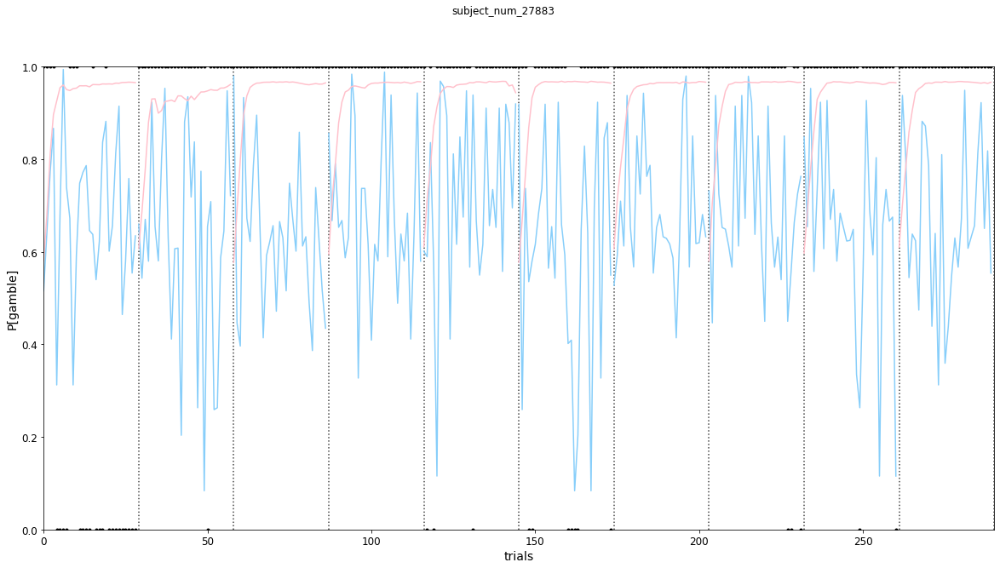

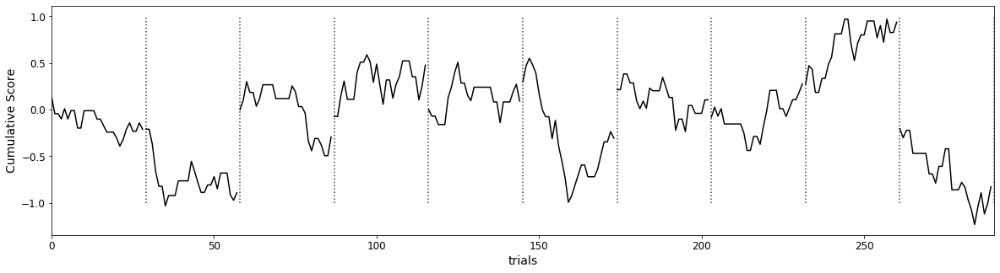

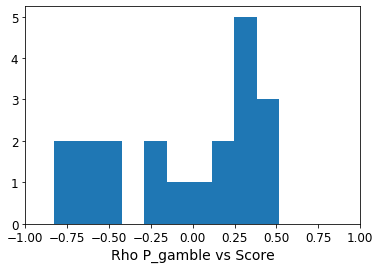

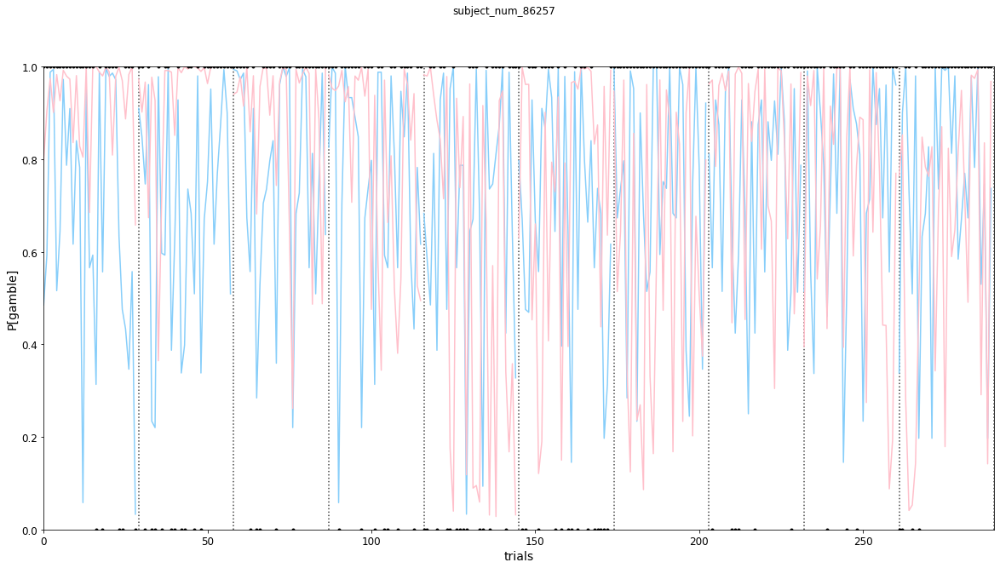

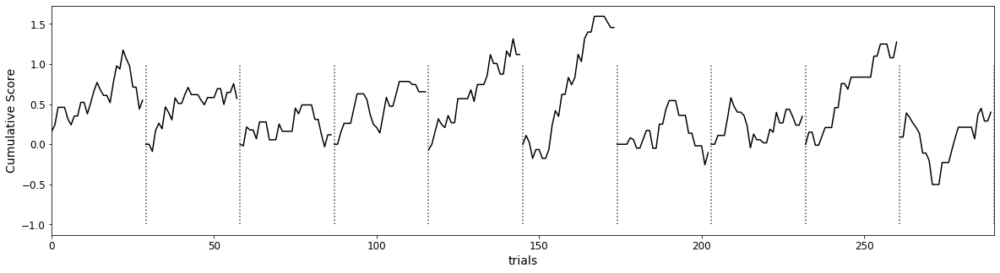

...

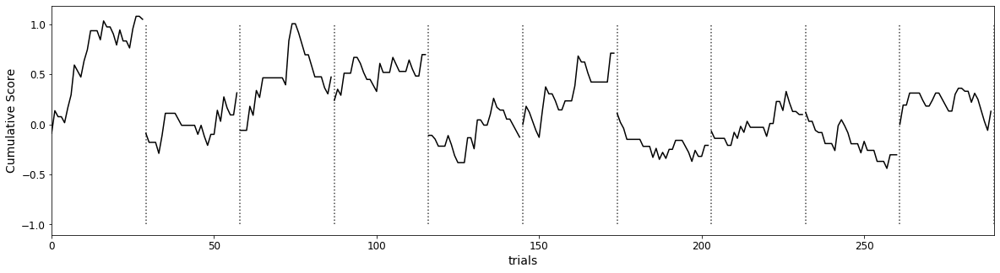

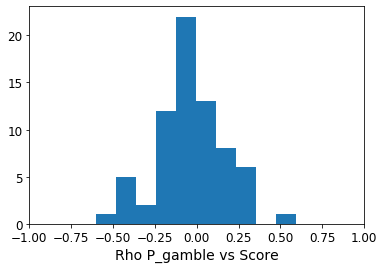

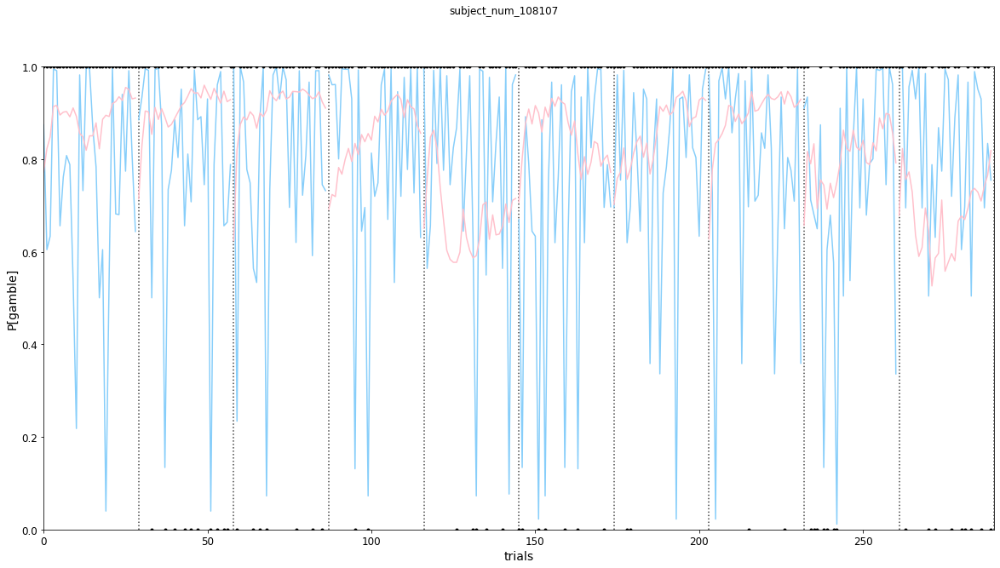

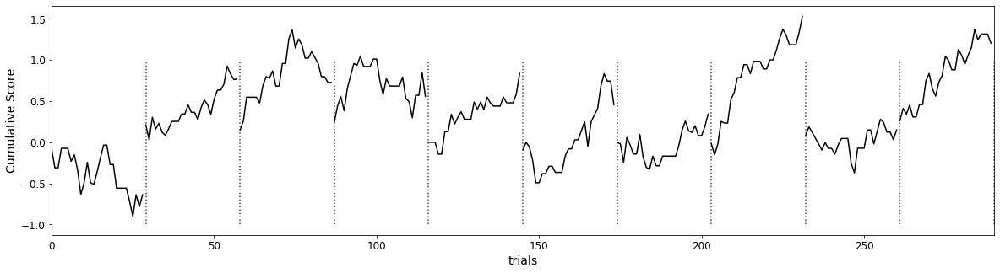

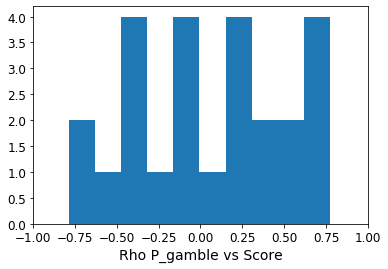

In [430]:
for num, subj_file_path in enumerate(subj_files_list):
# for num, subj_file_path in enumerate([subj_files_list[1]]):
    corr_gamble_score = []
    
    file_path  ="/Users/ritwik7/Dropbox (Personal)/Postdoc_UCL/DATA/rlab_incomplete_rewardSWB_code/by_RN/appdata/"+ subj_file_path
#     print(num)
    Keras_file_path = file_path
    Keras_file_path = Keras_file_path + "/Play_by_play"
    
    ## RNN P(gamble) ###
    prob_test_df_currprevopts= pd.read_csv(Keras_file_path + "/prob_train_currentprevopts_neurons="+str(neurons)+".csv")
    prob_test_df_currOprevRC= pd.read_csv(Keras_file_path + "/prob_train_currOprevRC_neurons="+str(neurons)+".csv")

    prob_test_df_currOprevC= pd.read_csv(Keras_file_path + "/prob_train_currOprevC_neurons="+str(neurons)+".csv")
    prob_test_df_currOprevR= pd.read_csv(Keras_file_path + "/prob_train_currOprevR_neurons="+str(neurons)+".csv")


    prob_test_df_currO= pd.read_csv(Keras_file_path + "/prob_train_currO_neurons="+str(neurons)+".csv")

    
    ### PT ####
    probchoice_test_df = pd.DataFrame(pd.read_csv(Keras_file_path + "/PT_probchoice_test_50_split_combined_1sthalf.csv").values.reshape(-1,29))
    
    
    
    ### DATA ###
    test_data_df = pd.read_csv(Keras_file_path + "/test_data.csv")
    
    
    plt.figure(figsize=(20,10))
    for ep in range(0,10):
        
        plt.plot(np.arange(ep*29,(ep+1)*29), probchoice_test_df.iloc[ep,:],linestyle="solid",color="lightskyblue",label="PT")

#         plt.plot(np.arange(ep*29,(ep+1)*29), prob_test_df_currprevopts.iloc[ep,1:], color="red",label="RNN CurrO+prevRCO")
#         plt.plot(np.arange(ep*29,(ep+1)*29), prob_test_df_currOprevRC.iloc[ep,1:],linestyle="dashed",color="red",label = "RNN Curro+prevRC")
    
#         plt.plot(np.arange(ep*29,(ep+1)*29), prob_test_df_currOprevR.iloc[ep,1:],linestyle="dashed",color="magenta",label = "RNN Curro+prevR")
        plt.plot(np.arange(ep*29,(ep+1)*29), prob_test_df_currOprevC.iloc[ep,1:],linestyle="solid",color="pink",label = "RNN Curro+prevC")

#         plt.plot(np.arange(ep*29,(ep+1)*29), prob_test_df_currO.iloc[ep,1:],linestyle="dotted",color="red",label = "RNN Curro")
        


        plt.plot(test_data_df.iloc[ep*29:(ep+1)*29].Choice,marker='.',color='black',linestyle='none')
#         plt.plot([ [(ep+1)*29,0],[(ep+1)*29,1] ],color='black',alpha=0.75, zorder=0)
        plt.plot([(ep+1)*29,(ep+1)*29],[0,1],color='black',alpha=0.75, zorder=0,linestyle="dotted")


#     prob_test_df.iloc[:,1:].mean().plot(color="black",linewidth=2)
    plt.ylim([0,1])
    plt.xlabel('trials')
    plt.ylabel('P[gamble]')
    plt.ylim([0,1])
    plt.suptitle(subj_file_path)
    
    plt.xlim([0,29*10])
#     plt.legend(loc=0)
    
    plt.figure(figsize=(20,5))
    for ep in range(0,10):
        plt.plot(np.arange(ep*29,(ep+1)*29), test_data_df.iloc[ep*29:(ep+1)*29].Outcome.cumsum()/500, color="black",label = "Cumulative score")
        plt.plot([(ep+1)*29,(ep+1)*29],[-1,1],color='black',alpha=0.75, zorder=0,linestyle="dotted")

    
    plt.xlabel('trials')
    plt.ylabel('Cumulative Score')
    plt.xlim([0,29*10])
    
    for ep in range(0, int(test_data_df.shape[0]/29)):

            corr_gamble_score.append(sc_stats.spearmanr(test_data_df.iloc[ep*29:(ep+1)*29].Outcome.cumsum(), prob_test_df_currOprevC.iloc[ep,1:])[0])

    plt.figure()
    plt.hist(corr_gamble_score); plt.xlabel("Rho P_gamble vs Score"); plt.xlim([-1,1])



    

    
    
    